<a href="https://colab.research.google.com/github/aghosh92/ELIT/blob/main/elit_graphene_v3b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ensemble Learning Iterative Training (ELIT)

**System**: Graphene with impurities

**STEM experiment:** by Ondrej Dyck

**Molecular Dynamics (MD) Simulations** by Bobby Sumpter and Ayana Ghosh

**Machine Learning Framework, implementation and models development** by Maxim Ziatdinov, Sergei V. Kalinin

**Notebook Preparation and models training** by Ayana Ghosh

---


The goal of this study is to show how the ensemble learning and iterative training (ELIT) framework can be used for iteratively adapting model(s) trained on simulated data to real-world experimental images.

0. Train ensemble of models using MD-simulated data of graphene at 300 K. No impurities or amorphous parts were present in the supercells of graphene.

1.   Apply the trained ensemble of models to experimental data and compare results between different models.

2.   The best ensemble model is then applied to an experimental graphene movie for locating atoms, with (optional) postporcessing for separating lattice and amorphous phases via Gaussian Mixture Model (GMM).

3. The new ensemble is trained using a "good" (artifact-free) portion of results from (2), which is the first *n* frames of the entire movie (*n* = 6, 21). Once trained, it is used on all the remaining frames (not used for training) to obtain accurate pixel-wise classification of the entire dataset.

4. The information about atomic positions (obtained in (3)) and the corresponding raw pixel intensities is used to creat multi-class labels (segmentation masks) and (re)train the ensemble of models on the multi-class data to categorize each pixel as belogning to lattice C atoms, impurities, or background.


---





If you would like to retrain the models (instead of using the ones provided), it may be a good idea to mount a google drive so that the models can be stored there during and at the end of training.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Install AtomAI:

In [ ]:
!pip install git+https://github.com/ziatdinovmax/atomai@legacy

  Cloning https://github.com/ziatdinovmax/atomai (to revision legacy) to /tmp/pip-req-build-gd_06dig
  Running command git clone -q https://github.com/ziatdinovmax/atomai /tmp/pip-req-build-gd_06dig
  Running command git checkout -b legacy --track origin/legacy
  Switched to a new branch 'legacy'
  Branch 'legacy' set up to track remote branch 'legacy' from 'origin'.
  Created wheel for atomai: filename=atomai-0.5.2-cp36-none-any.whl size=77540 sha256=159f5364f3bb26c07a4e21ac66ca29adba5fd966d77897b587fa1b0037810f09
  Stored in directory: /tmp/pip-ephem-wheel-cache-mtmgut2a/wheels/d7/0a/47/8ec936caf861943ccc275ce175431c92dfa4e1a01c96e1a7fd
Successfully built atomai


Import essential packages:

In [ ]:
import atomai as aoi
import matplotlib.pyplot as plt
import numpy as np
from copy import deepcopy as dc
import torch
from skimage import io
from sklearn.model_selection import train_test_split

Load experimental data (we are going to need it many times throughout this notebook):

Downloading...
From: https://drive.google.com/uc?id=1lY-_IfKIn-srJAWNx24bHUL1ldniow80
To: /content/3D Stack8 10nmfov.tif
420MB [00:02, 174MB/s]
(100, 896, 896)


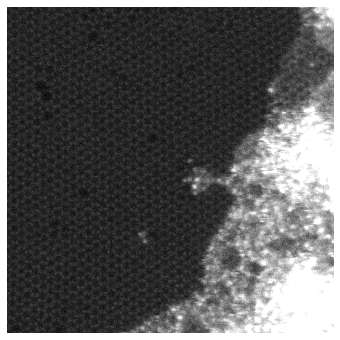

In [ ]:
!gdown https://drive.google.com/uc?id=1lY-_IfKIn-srJAWNx24bHUL1ldniow80

filename = "3D Stack8 10nmfov.tif"
imgdata = io.imread(filename)[:, 128:, 128:] # get rid of the "fly-back delay" part
print(imgdata.shape)

plt.figure(figsize=(6, 6))
plt.imshow(imgdata[0], origin="lower", cmap='gray', vmin=0, vmax=0.7)
plt.axis('off');

We start by training an ensemble of models from which we are going to select the basline model(s). Note that once trained, you can skip this part and focus on the iterative training part.

Load (clean) data created from MD simulations:

In [ ]:
!gdown https://drive.google.com/uc?id=1iFZvHKkOLWxPVe6dlm5GTJOSimAZJCMf
!gdown https://drive.google.com/uc?id=1-7zoBi8dDSu7Zs97restiG0jNri-rE6m

Downloading...
From: https://drive.google.com/uc?id=1iFZvHKkOLWxPVe6dlm5GTJOSimAZJCMf
To: /content/cropped_images_new.npy
3.17GB [00:37, 85.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-7zoBi8dDSu7Zs97restiG0jNri-rE6m
To: /content/cropped_masks_new.npy
3.17GB [00:37, 84.7MB/s]


In [ ]:
X_train = np.load('cropped_images_new.npy')
y_train = np.load('cropped_masks_new.npy')
print(X_train.shape, y_train.shape)

(6046, 256, 256) (6046, 256, 256)


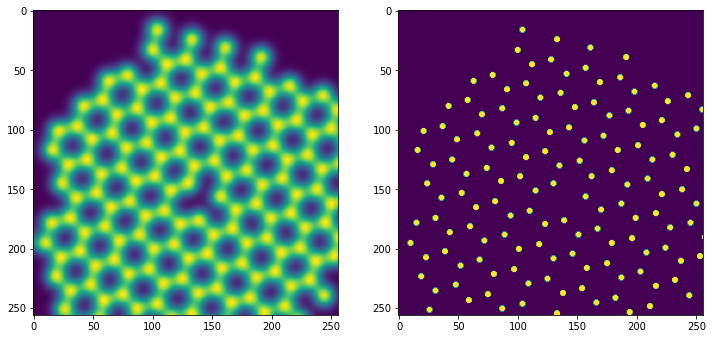

In [ ]:
k = 35

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(X_train[k])
ax2.imshow(y_train[k])

Augment data so that the trained models can generalize to real experimental data:

In [ ]:
dt = aoi.transforms.datatransform(1, # number of classes
                                  gauss_noise=[2000, 3000], # scaled values
                                  poisson_noise=[30, 45],
                                  blur=False,
                                  contrast=True,
                                  zoom=True,
                                  resize=[2, 1], # downsize all the images by a factor of 2
                                  seed=1)

X_train, y_train = dt.run(X_train, y_train[..., None])

(-0.5, 255.5, 255.5, -0.5)

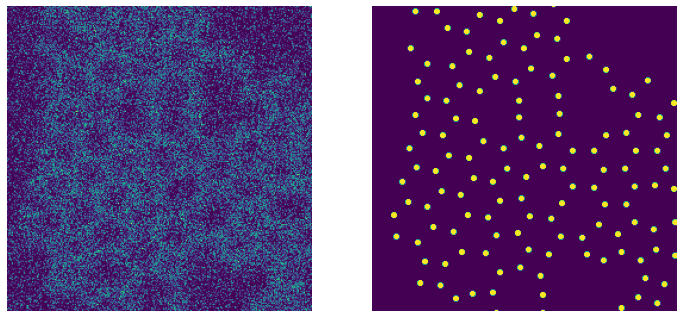

In [ ]:
k = 2104

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(X_train[k,0])
ax2.imshow(y_train[k,0])
ax1.axis('off')
ax2.axis('off')

Train ensemble of model starting evey time with dfifferent (randomly initialized weights)

In [ ]:
train_new = False

if train_new:
    etrainer = aoi.atomnet.ensemble_trainer(
        images, masks, # training/test split is done automatically inside the trainer
        model='dilUnet', nb_filters=64, layers=[2, 3, 3, 4], # model specs
        with_dilation=False, use_batchnorm=True, upsampling="bilinear", # model specs
        n_models=20, strategy="from_scratch",# ensemble specs
        batch_size=8, training_cycles_base=2000, swa=True, # training specs
        filename="graphene_md_dilUnet2_ensemble.tar") # savename - adjsut appropriately

    ensemble, smodel = etrainer.run()

else:
    !gdown https://drive.google.com/uc?id=144GFPptAphHlUOVgRX7_ZeNIPjXcVyKb
    smodel, ensemble = aoi.load_ensemble("graphene_md_dilUnet2_ensemble.tar")

Downloading...
From: https://drive.google.com/uc?id=144GFPptAphHlUOVgRX7_ZeNIPjXcVyKb
To: /content/graphene_md_dilUnet2_ensemble.tar
1.07GB [00:10, 99.2MB/s]


Apply each model from ensemble trained on simulated data to the real experimental data data:

/usr/local/lib/python3.6/dist-packages/atomai/atomnet/infer.py:163: UserWarning: The default output of predictor.decode() and predictor.run() is now ```nn_output, coords``` instead of ```nn_input, (nn_output, coords)```
  warnings.warn(warn_msg, UserWarning)


Batch 1/1
1 image was decoded in approximately 0.2928 seconds


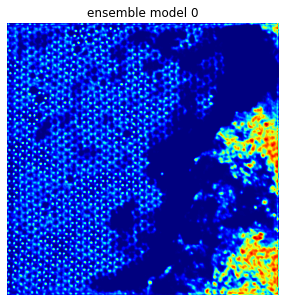

Batch 1/1
1 image was decoded in approximately 0.2512 seconds


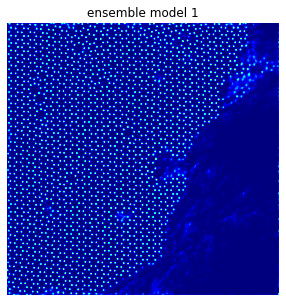

Batch 1/1
1 image was decoded in approximately 0.2496 seconds


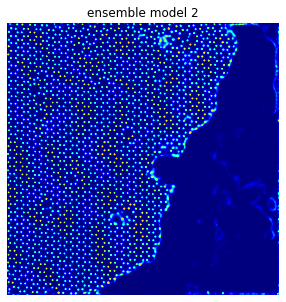

Batch 1/1
1 image was decoded in approximately 0.2503 seconds


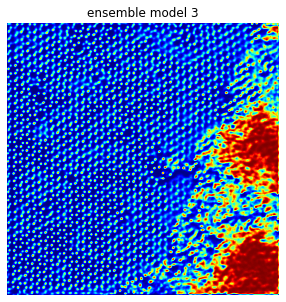

Batch 1/1
1 image was decoded in approximately 0.2515 seconds


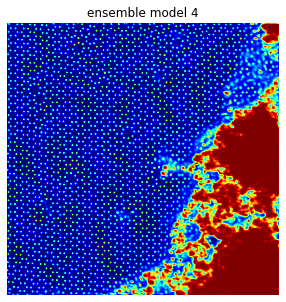

Batch 1/1
1 image was decoded in approximately 0.2512 seconds


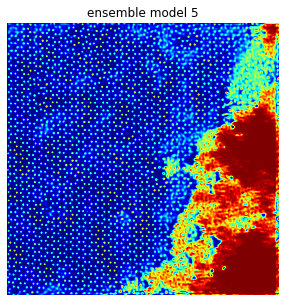

Batch 1/1
1 image was decoded in approximately 0.2538 seconds


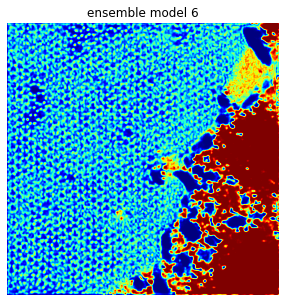

Batch 1/1
1 image was decoded in approximately 0.2642 seconds


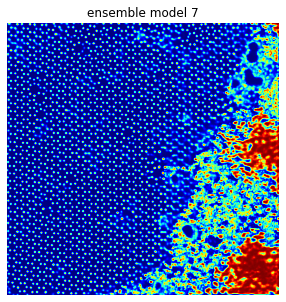

Batch 1/1
1 image was decoded in approximately 0.2505 seconds


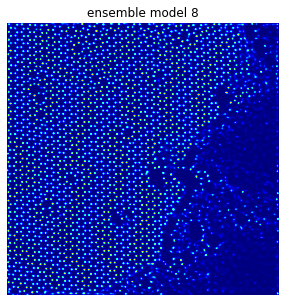

Batch 1/1
1 image was decoded in approximately 0.2496 seconds


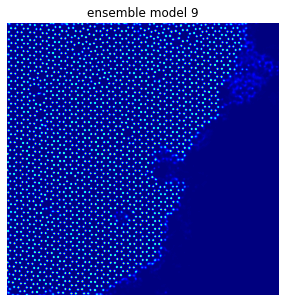

Batch 1/1
1 image was decoded in approximately 0.2493 seconds


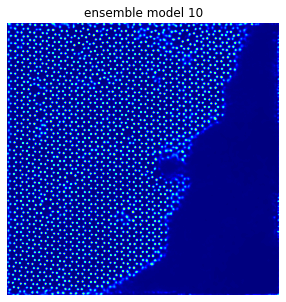

Batch 1/1
1 image was decoded in approximately 0.247 seconds


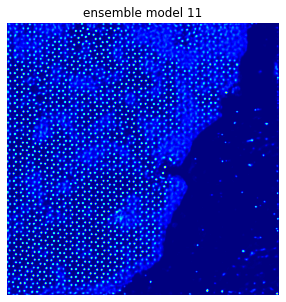

Batch 1/1
1 image was decoded in approximately 0.2487 seconds


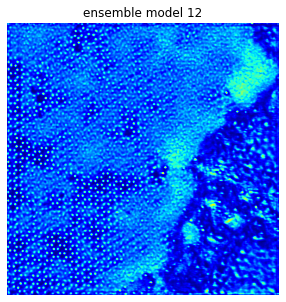

Batch 1/1
1 image was decoded in approximately 0.2518 seconds


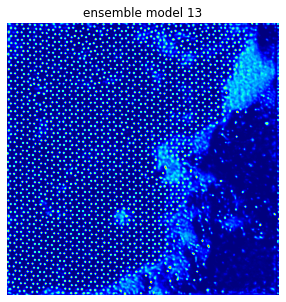

Batch 1/1
1 image was decoded in approximately 0.2486 seconds


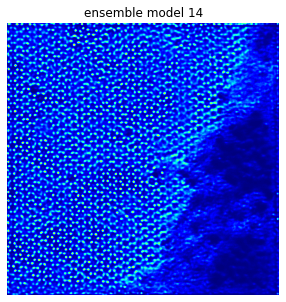

Batch 1/1
1 image was decoded in approximately 0.2505 seconds


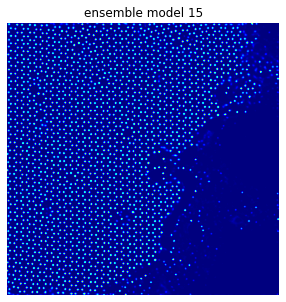

Batch 1/1
1 image was decoded in approximately 0.2522 seconds


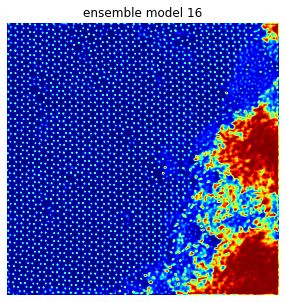

Batch 1/1
1 image was decoded in approximately 0.2511 seconds


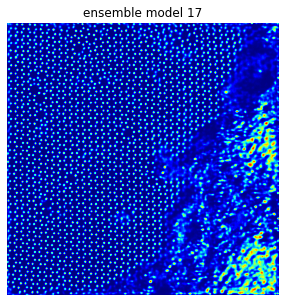

Batch 1/1
1 image was decoded in approximately 0.2474 seconds


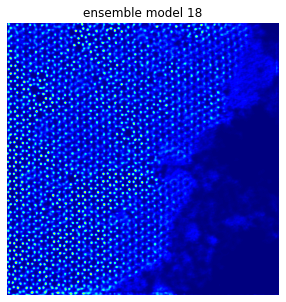

Batch 1/1
1 image was decoded in approximately 0.2502 seconds


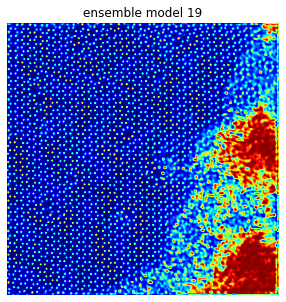

In [ ]:
for i, m in enumerate(ensemble.values()):
    smodel.load_state_dict(m)
    nn_out, _ = aoi.atomnet.predictor(smodel, use_gpu=True).run(imgdata[0]) # apply to frame 0
    plt.figure(figsize=(5, 5))
    plt.imshow(nn_out[0,...,0], origin="lower", cmap='jet', interpolation="Gaussian")
    plt.title("ensemble model {}".format(i))
    plt.axis('off')
    plt.show()

Choose and load the best ensemble model.

Here, ensemble model 19 is chosen here for the subsequent analyses.

In [ ]:
smodel.load_state_dict(ensemble[19])

<All keys matched successfully>

In [ ]:
decoded_imgs, coordinates = aoi.atomnet.predictor(smodel, use_gpu=True).run(imgdata)

/usr/local/lib/python3.6/dist-packages/atomai/atomnet/infer.py:163: UserWarning: The default output of predictor.decode() and predictor.run() is now ```nn_output, coords``` instead of ```nn_input, (nn_output, coords)```
  warnings.warn(warn_msg, UserWarning)


Batch 100/100
100 images were decoded in approximately 25.0505 seconds


View predictions on selected frames:

Text(0.5, 1.0, 'Frame 90')

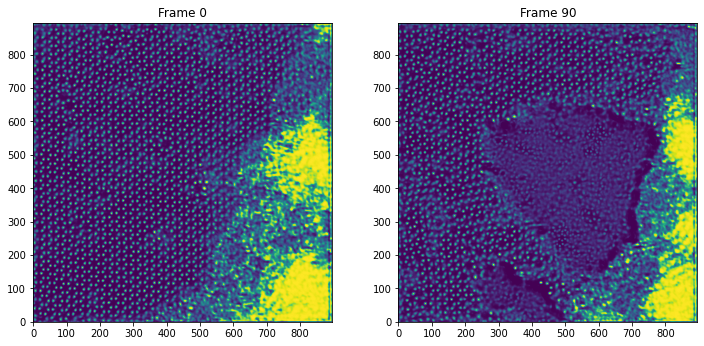

In [ ]:
k1, k2 = 0, 90 # frame at the beginning and at the end of STEM movie
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5.5))
ax1.imshow(decoded_imgs[0,...,0], origin="lower")
ax1.set_title("Frame {}".format(k1))
ax2.imshow(decoded_imgs[90,...,0], origin="lower")
ax2.set_title("Frame {}".format(k2))

This function separates into 2 classes (lattice & amorphous) using GMM:

In [ ]:
def gmm_classify(coord_dict_pred):
  coordinates = aoi.atomstat.update_classes(coord_dict_pred, imgdata, method="gmm_local",
    n_components=2, window_size=48, coord_class=0) # other methods: kmeans, meanshift, threshold
  return coordinates

Here we use GMM classification to separate amorphous part from the lattice. Hence, before using the GMM classification, it is important to check if there is both lattice & amorphous phase shown by the ensemble model. 

As an example, ensemble model 19 shows both lattice and amorphous phase in the initial prediction. Therefore, the user has chosen 'Y' (yes) for this optional step.

Can you see both lattice & amorphous phase generated by the model you just loaded ? Y or N   
Y
  

Your answer is: Y
Please execute the following steps before moving on to Iterative Training 00 cell.


/usr/local/lib/python3.6/dist-packages/atomai/atomstat/multivar.py:94: UserWarning: The crop_size argument is deprecated. Use window_size to specify size of subimages
  UserWarning)



GMM components


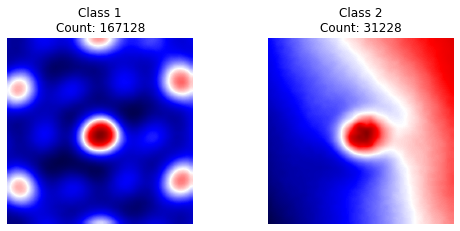

In [ ]:
text = input('Can you see both lattice & amorphous phase generated by the model you just loaded ? Y or N   \n')
print("  \n")
print("Your answer is:",text)
if text == 'Y':
  print('Please execute the following steps before moving on to Iterative Training 00 cell.')
  #gmm classification
  coordinates = gmm_classify(coordinates)
else:
  print('Please skip the following steps and jump to cell named Iterative Training 00 cell.')

Here one component clearly corresponds to the amorphous phase and another one to the lattice.

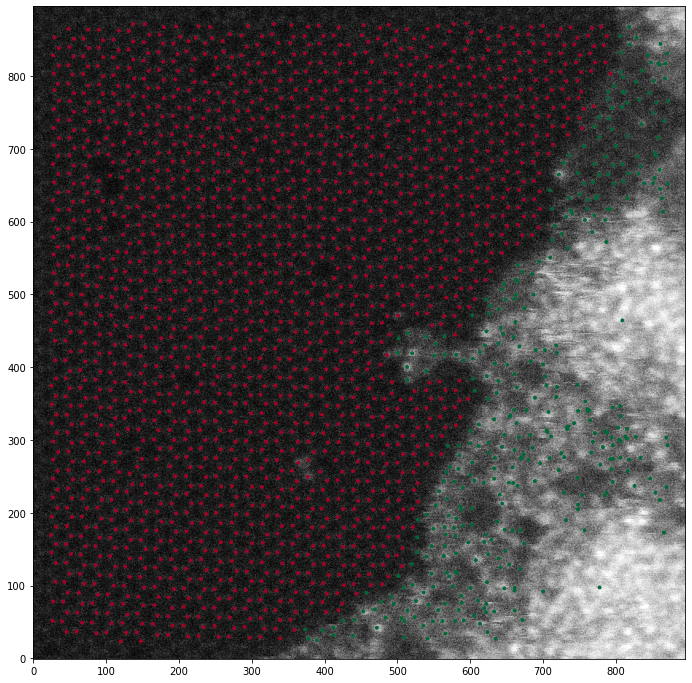

In [ ]:
# Plot results
k = 0 # frame number
aoi.utils.plot_coord(imgdata[k, ...], coordinates[k], fsize=12)

Now let's filter out the coordinates corresponding to the amorphous phase:

In [ ]:
coordinates_filtered = {}
for k, c in coordinates.items():
    coordinates_filtered[k] = c[c[:, -1] == 0] # adjust the "amorphous phase" class (0 or 1) if necessary

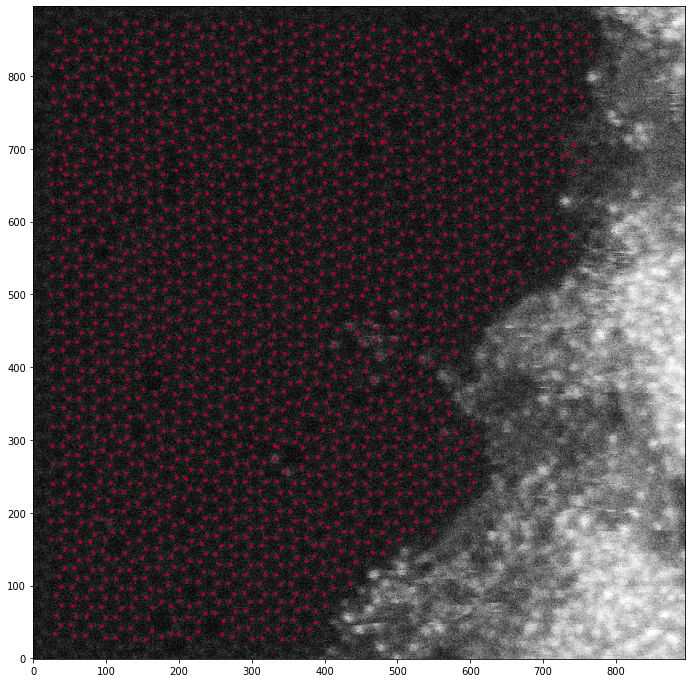

In [ ]:
# Plot results
k = 20 # frame number
aoi.utils.plot_coord(imgdata[k, ...], coordinates_filtered[k], fsize=12)

### Iterative training 00: Adapting to experimental data

Now let's train a more narrowly-focused NN using the previous NN as a baseline. First we need to create a new training set. this time from the experimental data. Here we will use the same idea as in our [earlier work](https://www.nature.com/articles/s41524-019-0152-9) that for the movies of atomic transformations it is sufficient to train NN only on the first several frames where the positions are well defined (low degree of disorder) and we can easily label them.

Create ground truth for iterative training:

In [ ]:
masks = np.zeros((21, *imgdata.shape[1:]))
for i in range(21):
    masks[i] = aoi.utils.create_lattice_mask(imgdata[i], coordinates_filtered[i][:, :-1])

In [ ]:
X_train, y_train = aoi.utils.extract_patches(imgdata[:21], masks, patch_size=224, num_patches=200)
print(X_train.shape, y_train.shape)

(4200, 224, 224) (4200, 224, 224)


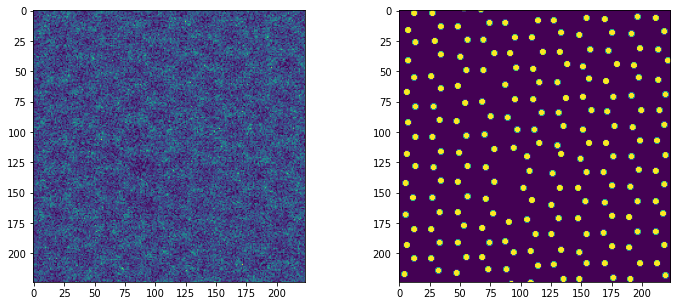

In [ ]:
k = 600
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(X_train[k])
ax2.imshow(y_train[k])

In [ ]:
add_noise = True

if add_noise:

    dt = aoi.transforms.datatransform(1, # number of classes
                                    gauss_noise=[0, 100], # scaled values
                                    #contrast=True,
                                    zoom=1.1,
                                    rotation=True,
                                    seed=1)

    X_train, y_train = dt.run(X_train, y_train[..., None])

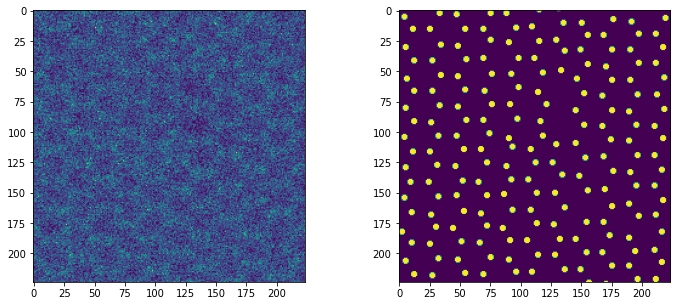

In [ ]:
if add_noise:
    k = 600
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ax1.imshow(X_train[k, 0])
    ax2.imshow(y_train[k,0])

In [ ]:
#show model architecture. 
#Note that the architecture of this model should be identical to the model to be trained in the next cell 
#to ensure appropriate use of 'baseline approach'.
smodel

dilUnet(
  (c1): convblock(
    (block): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): LeakyReLU(negative_slope=0.01)
      (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (c2): convblock(
    (block): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): LeakyReLU(negative_slope=0.01)
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): Conv2d(128, 128, kernel_size=(3, 3), s

Train a new ensemble from scratch using experimental images as training data:

In [ ]:
train_new = False

if train_new:
    etrainer = aoi.atomnet.ensemble_trainer(
        X_train, y_train, strategy="from_scratch", model='dilUnet', 
        nb_filters=64, layers=[2, 3, 3, 4], with_dilation=False,
        use_batchnorm=True, batch_size=12, n_models=6,
        training_cycles_base=20, swa=True, full_epoch=True,
        filename="/content/drive/MyDrive/research/elit/graphene_elit_00_2b")

    ensemble_00, smodel_00 = etrainer.run()
else:
    !gdown https://drive.google.com/uc?id=1-NIrUImUevBl1pGor4z0fudpb7qomIQk
    smodel_00, ensemble_00 = aoi.load_ensemble("graphene_elit_00_2b_ensemble.tar")

Downloading...
From: https://drive.google.com/uc?id=1-NIrUImUevBl1pGor4z0fudpb7qomIQk
To: /content/graphene_elit_00_2b_ensemble.tar
482MB [00:03, 133MB/s]


Prediction with the re-trained ensemble:

In [ ]:
# Initialize predictor
p = aoi.atomnet.ensemble_predictor(smodel_00, ensemble_00)

Batch 1/1

/usr/local/lib/python3.6/dist-packages/atomai/atomnet/infer.py:163: UserWarning: The default output of predictor.decode() and predictor.run() is now ```nn_output, coords``` instead of ```nn_input, (nn_output, coords)```
  warnings.warn(warn_msg, UserWarning)


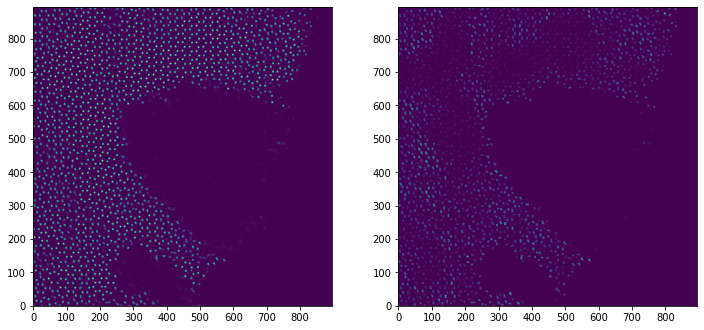

In [ ]:
# prediction with uncertainty on individual frame
k = 90

(img_mean, img_var), _ = p.run(imgdata[k:k+1])
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5.5))
ax1.imshow(img_mean[0,...,0], origin="lower")
ax2.imshow(img_var[0,...,0], origin="lower")

Make a prediction on the entire set using the ensemble trained from baseline:

In [ ]:
(decoded_imgs, decoded_var), _ = p.run(imgdata, num_batches=20)

Batch 1/20

/usr/local/lib/python3.6/dist-packages/atomai/atomnet/infer.py:163: UserWarning: The default output of predictor.decode() and predictor.run() is now ```nn_output, coords``` instead of ```nn_input, (nn_output, coords)```
  warnings.warn(warn_msg, UserWarning)


Batch 20/20

In [ ]:
coordinates = aoi.atomnet.locator(thresh=0.33).run(decoded_imgs)

View results for selected frames:

Text(0.5, 1.0, 'Original Frame 0')

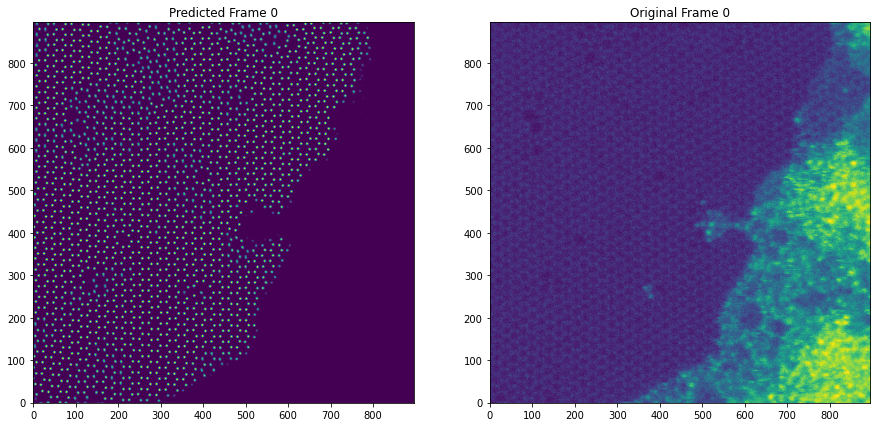

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[0,...,0], origin="lower")
ax1.set_title('Predicted Frame 0')
ax2.imshow(imgdata[0,...], origin="lower")
ax2.set_title('Original Frame 0')

Text(0.5, 1.0, 'Original Frame 25')

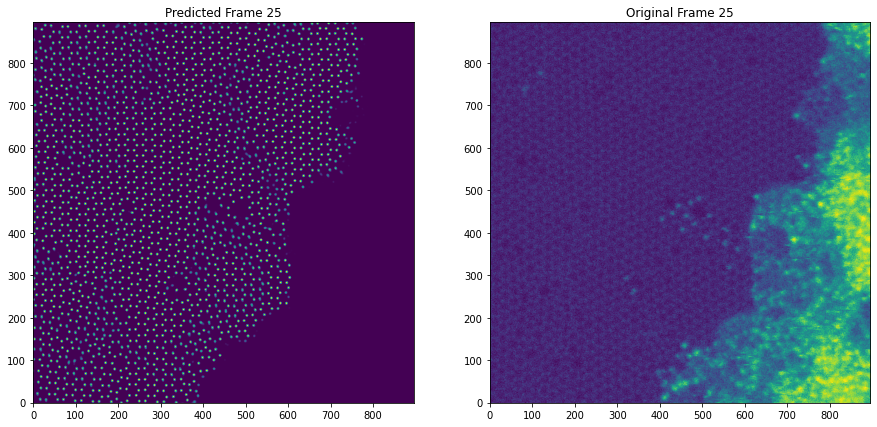

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[25,...,0], origin="lower")
ax1.set_title('Predicted Frame 25')
ax2.imshow(imgdata[25,...], origin="lower")
ax2.set_title('Original Frame 25')

Text(0.5, 1.0, 'Original Frame 50')

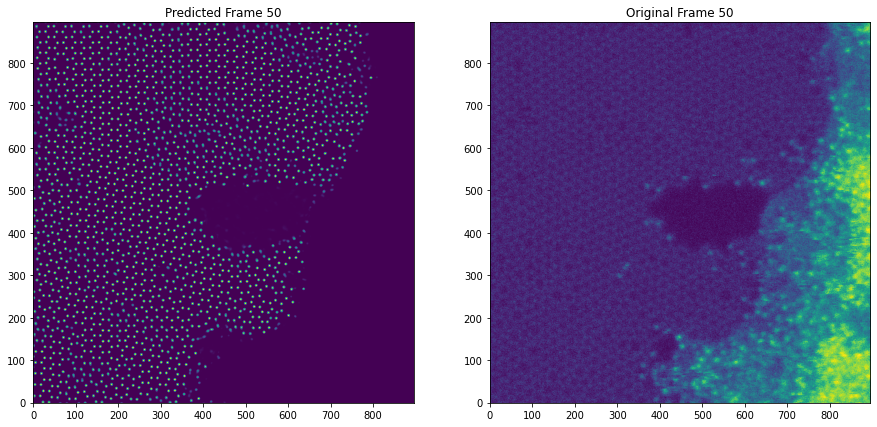

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[50,...,0], origin="lower")
ax1.set_title('Predicted Frame 50')
ax2.imshow(imgdata[50,...], origin="lower")
ax2.set_title('Original Frame 50')

Text(0.5, 1.0, 'Original Frame 75')

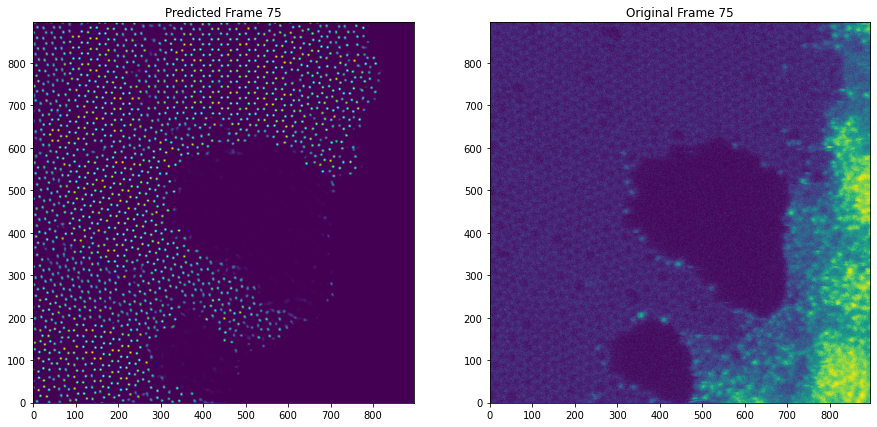

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[75,...,0], origin="lower")
ax1.set_title('Predicted Frame 75')
ax2.imshow(imgdata[75,...], origin="lower")
ax2.set_title('Original Frame 75')

Text(0.5, 1.0, 'Original Frame 99')

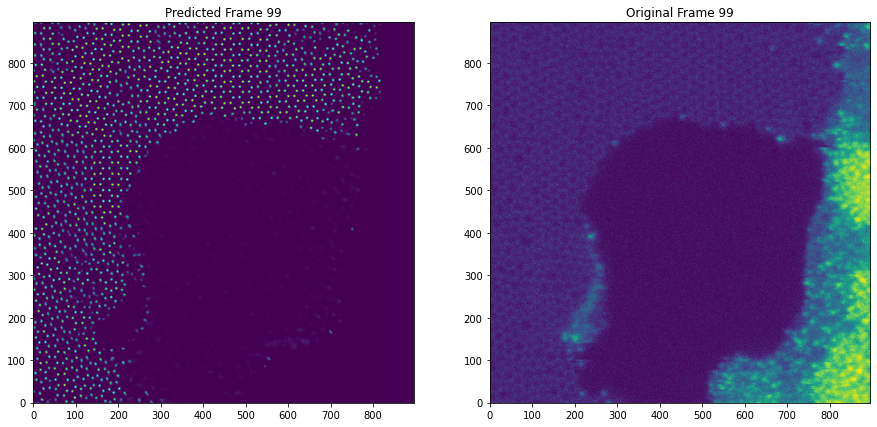

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[99,...,0], origin="lower")
ax1.set_title('Predicted Frame 99')
ax2.imshow(imgdata[99,...], origin="lower")
ax2.set_title('Original Frame 99')

## Iterative training 01: Multi-class classification (lattice + impurities)

Create ground truth for training using multiclass (C atom vs. point impurities vs everything else) data.

Note that GMM classification isn’t necessary here since the phases are already separated.

Hence we only update atomic/defect classes based on the calculated intensities at each predicted position or local neighborhood analysis based on subimages cropped around each predicted position.

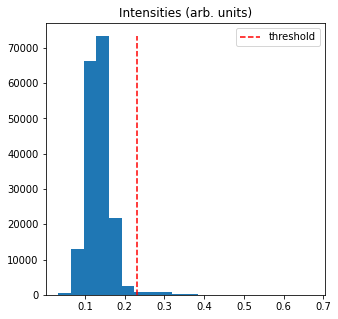

In [ ]:
#update coordinates class
coordinates = aoi.atomstat.update_classes(
    coordinates, imgdata, method="threshold",window_size=48, thresh=0.23) # other methods: kmeans, meanshift, gmm_local

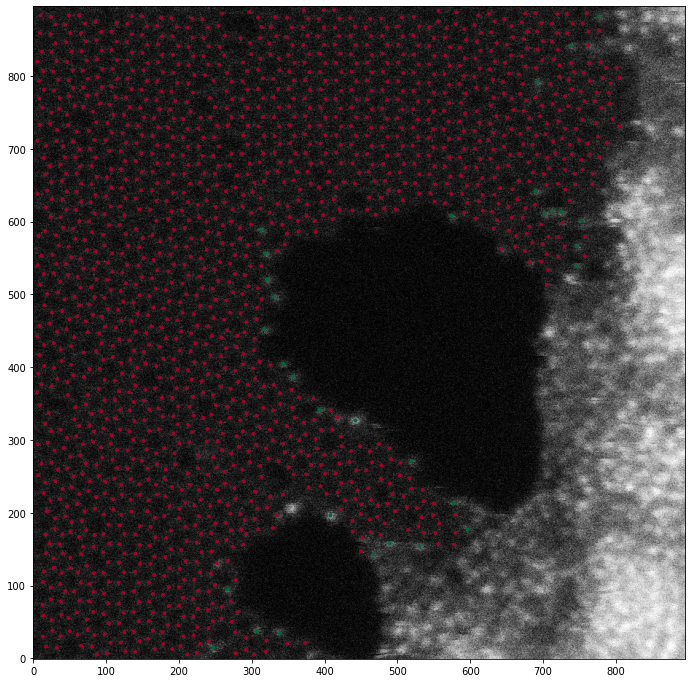

In [ ]:
k = 75 # frame number
aoi.utils.plot_coord(imgdata[k, ...], coordinates[k], fsize=12)

Prepare ground truth for training using multiclass lattice masks:

In [ ]:
# multiclass masks
masks = aoi.utils.create_multiclass_lattice_mask(imgdata, dc(coordinates))

In [ ]:
masks.shape

(100, 896, 896, 3)

In [ ]:
# # "masks"
window_size = 224
masks_cropped, _, frames1 = aoi.utils.extract_subimages(
    masks, coordinates, window_size, 1)

In [ ]:
# # images
window_size = 224
images_cropped, _, frames2 = aoi.utils.extract_subimages(
    imgdata, coordinates, window_size, 1)

In [ ]:
X_train, y_train = aoi.transforms.squeeze_channels(images_cropped, masks_cropped)

In [ ]:
print(X_train.shape)
print(y_train.shape)

(2209, 224, 224)
(2209, 224, 224)


Visualize training data and multi-class segmentation masks:

Text(0.5, 1.0, 'Frame_25')

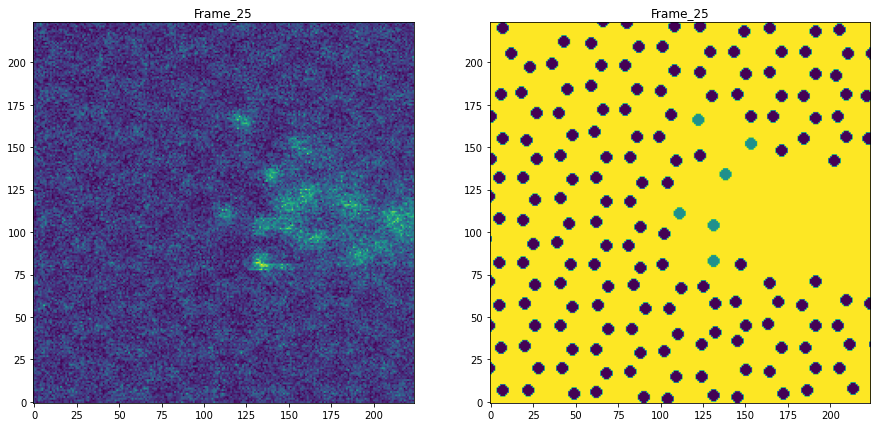

In [ ]:
k = 25

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(X_train[k,:,:], origin="lower")
ax1.set_title('Frame_{}'.format(k))
ax2.imshow(y_train[k,:,:], origin="lower")
ax2.set_title('Frame_{}'.format(k))

Text(0.5, 1.0, 'Frame_500')

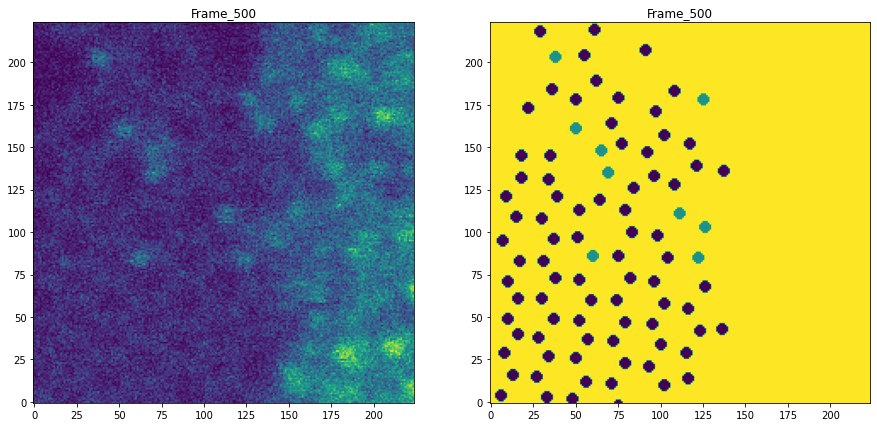

In [ ]:
k = 500

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(X_train[k,:,:], origin="lower")
ax1.set_title('Frame_{}'.format(k))
ax2.imshow(y_train[k,:,:], origin="lower")
ax2.set_title('Frame_{}'.format(k))

Text(0.5, 1.0, 'Frame_700')

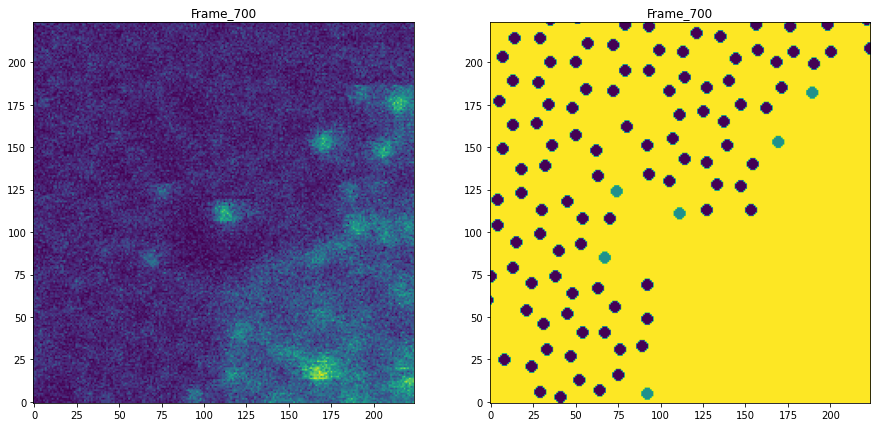

In [ ]:
k = 700

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(X_train[k,:,:], origin="lower")
ax1.set_title('Frame_{}'.format(k))
ax2.imshow(y_train[k,:,:], origin="lower")
ax2.set_title('Frame_{}'.format(k))

In [ ]:
add_noise = True

if add_noise:

    dt = aoi.transforms.datatransform(3, # number of classes
                                      "channel_first",
                                      "channel_first",
                                      gauss_noise=[0, 100], # scaled values
                                      #contrast=True,
                                      zoom=1.1,
                                      rotation=True,
                                      squeeze_channels=True,
                                      seed=1)

    X_train, y_train = dt.run(X_train, aoi.transforms.unsqueeze_channels(y_train, 3))


Train a new ensemble of multi-class models:

In [ ]:
train_new = False

if train_new:
    etrainer = aoi.atomnet.ensemble_trainer(
        X_train, y_train, strategy="from_scratch", model='dilUnet', 
        n_models=8, nb_filters=64, layers=[2, 3, 3, 4],
        with_dilation=False, use_batchnorm=True, batch_size=12,
        full_epoch=True, training_cycles_base=20, swa=True,
        filename="/content/drive/MyDrive/research/elit/graphene_elit_01_2b")

    ensemble_01, smodel_01 = etrainer.run()
else:
    !gdown https://drive.google.com/uc?id=1--0oL9K_k-1R6YgbqvK6MNdFYSG4OK2R
    smodel_01, ensemble_01 = aoi.load_ensemble("graphene_elit_01_2b_ensemble.tar")

Downloading...
From: https://drive.google.com/uc?id=1--0oL9K_k-1R6YgbqvK6MNdFYSG4OK2R
To: /content/graphene_elit_01_2b_ensemble.tar
590MB [00:06, 88.3MB/s]


Initialize predictors for trained models:

In [ ]:
p = aoi.atomnet.ensemble_predictor(smodel_01, ensemble_01)

Inspect predictions and associated uncertainty on different images:

Batch 1/1

/usr/local/lib/python3.6/dist-packages/atomai/atomnet/infer.py:163: UserWarning: The default output of predictor.decode() and predictor.run() is now ```nn_output, coords``` instead of ```nn_input, (nn_output, coords)```
  warnings.warn(warn_msg, UserWarning)


Text(0.5, 1.0, "Uncertainty: Class 'Si'")

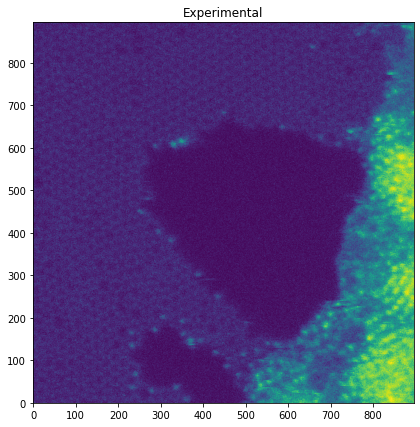

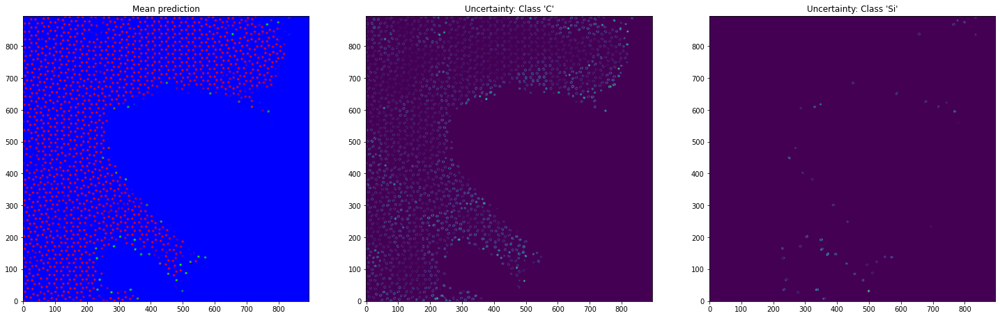

In [ ]:
k = 90

(decoded_imgs, decoded_var), _ = p.run(imgdata[k:k+1], num_batches=20)

plt.figure(figsize=(7, 7))
plt.imshow(imgdata[k], origin="lower")
plt.title("Experimental")
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(25, 8))
ax1.imshow(decoded_imgs[0], origin="lower")
ax1.set_title("Mean prediction")
ax2.imshow(decoded_var[0,...,0], origin="lower")
ax2.set_title("Uncertainty: Class 'C'")
ax3.imshow(decoded_var[0,...,1], origin="lower")
ax3.set_title("Uncertainty: Class 'Si'")

Apply the newly trained ensemble to the entire experimental data

In [ ]:
(decoded_imgs, decoded_var), _ = p.run(imgdata, num_batches=20)
coordinates = aoi.atomnet.locator(threshold=0.33).run(decoded_imgs)

Batch 1/20

/usr/local/lib/python3.6/dist-packages/atomai/atomnet/infer.py:163: UserWarning: The default output of predictor.decode() and predictor.run() is now ```nn_output, coords``` instead of ```nn_input, (nn_output, coords)```
  warnings.warn(warn_msg, UserWarning)


Batch 20/20

Text(0.5, 1.0, 'Original Frame 0')

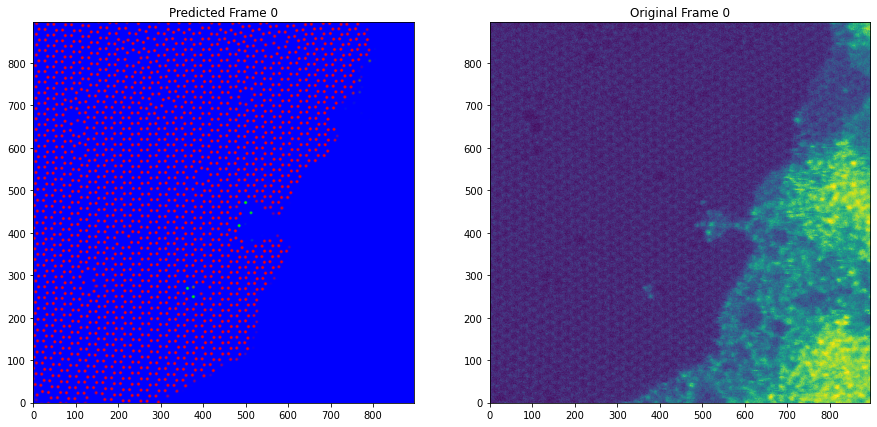

In [ ]:
# Frame 0
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[0,...], origin="lower")
ax1.set_title('Predicted Frame 0')
ax2.imshow(imgdata[0,...], origin="lower")
ax2.set_title('Original Frame 0')

Text(0.5, 1.0, 'Original Frame 25')

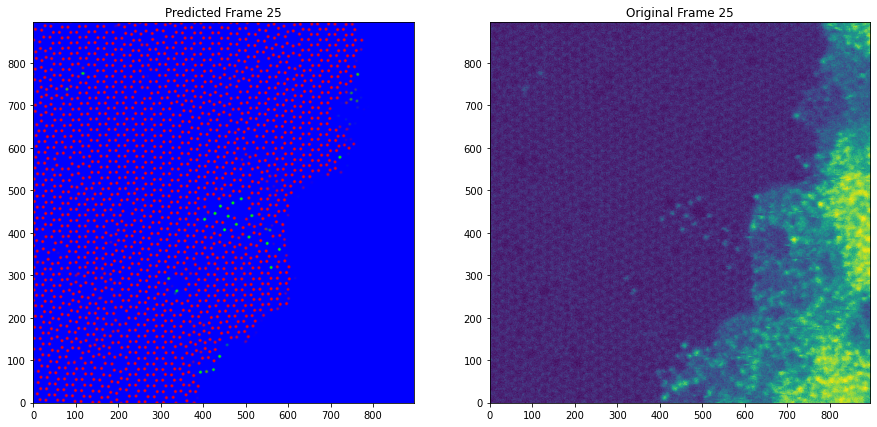

In [ ]:
# Frame 25
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[25,...], origin="lower")
ax1.set_title('Predicted Frame 25')
ax2.imshow(imgdata[25,...], origin="lower")
ax2.set_title('Original Frame 25')

Text(0.5, 1.0, 'Original Frame 50')

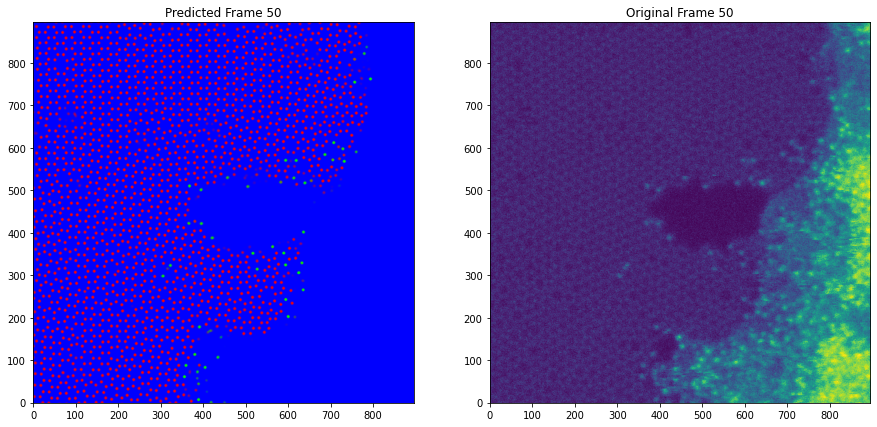

In [ ]:
# Frame 50
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[50,...], origin="lower")
ax1.set_title('Predicted Frame 50')
ax2.imshow(imgdata[50,...], origin="lower")
ax2.set_title('Original Frame 50')

Text(0.5, 1.0, 'Original Frame 75')

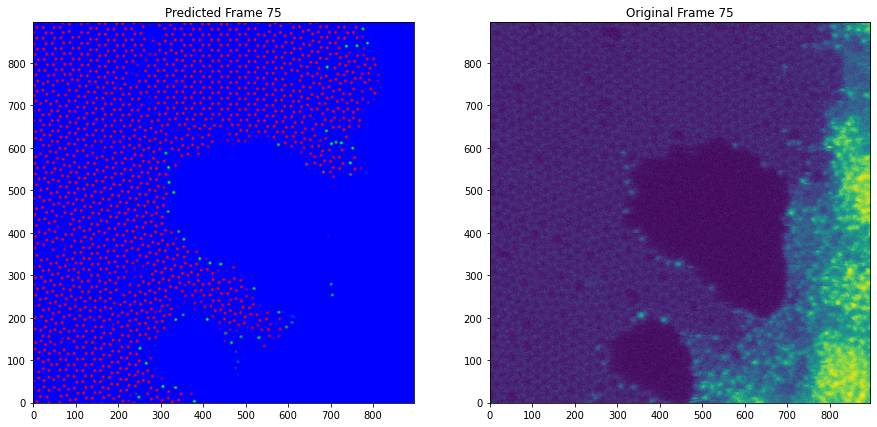

In [ ]:
# Frame 75
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[75,...], origin="lower")
ax1.set_title('Predicted Frame 75')
ax2.imshow(imgdata[75,...], origin="lower")
ax2.set_title('Original Frame 75')

Text(0.5, 1.0, 'original Frame 99')

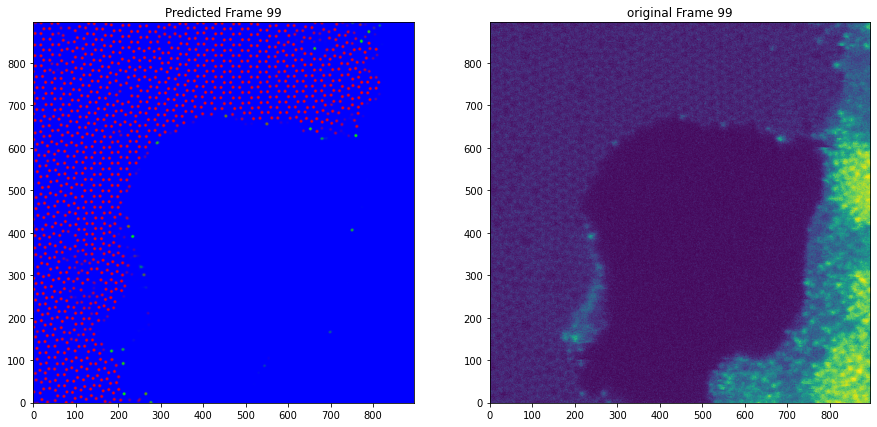

In [ ]:
# Frame 99
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
ax1.imshow(decoded_imgs[99,...], origin="lower")
ax1.set_title('Predicted Frame 99')
ax2.imshow(imgdata[99,...], origin="lower")
ax2.set_title('original Frame 99')

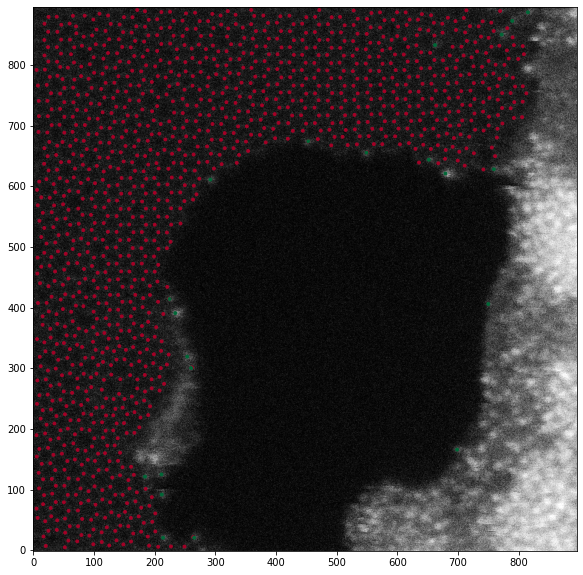

In [ ]:
k = 99
aoi.utils.plot_coord(imgdata[k], coordinates[k], fsize=10)